In [ ]:

# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_09.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_08.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_07.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_06.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_05.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_02.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_12_01.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_11_30.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_11_29.csv"
# f = r"C:\BidAskRepo\NQ 12-22 Globex_2022_11_28.csv"# var_holder = {}
 
# for i in range(10):
#     var_holder['my_var_' + str(i)] = "iterationNumber == " + str(i)
#     print(var_holder['my_var_' + str(i)] )
# locals().update(var_holder)
 
# print(my_var_0)


In [1]:
import pandas as pd
import numpy as np
import os
import json
import pandas_datareader.data as web   # my local kernel Python 3.10.7 
import matplotlib.pyplot as plt  # unavailable?  do: 1. pip uninstall matplotlib # 2. python3 -m pip install matplotlib
%matplotlib inline
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import datetime
import io
pd.set_option('display.max_columns', None)
import warnings
import seaborn as sns
import scipy
from scipy import stats
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import talib as ta

import scipy
from scipy import stats


### Procedure for creating df's and saving them with names localy, w or w/o chart/table at sampling rates/intervals

In [134]:
#----------get directory of csv and make list   we need:  # to_df_OHLC('C:\\BidAskRepo\\ES 03-23 Globex_2022_12_06.csv' , '1Min', True)  
import os
path = "C:\BidAskRepo"
dd = os.listdir(path)
dd.sort()
#----------deal with string of file ------------
repo = []
for i in range(len(dd)):    
    from pathlib import Path
    data_folder = Path("C:/BidAskRepo/")
    file_to_open = data_folder/str(dd[i])
    repo.append(file_to_open.__str__())
    
print(len(repo))

180


In [ ]:
var_holder = {}               
for i in range(1, len(repo)):
    x = repo[i].replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','_').replace('.csv', '').strip() 
    var_holder[x] = x
    var_holder[x] = to_df_OHLC(repo[i], '30S', True, False)
    # var_holder[x].to_csv('C:\\30S\\'+ x + '.csv')

In [ ]:
var_holder = {}               
for i in range(1, len(repo)):
    x = repo[i].replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','_').replace('.csv', '').strip() 
    var_holder[x] = x
    var_holder[x] = to_df_OHLC(repo[i], '1Min', True, False)
    # var_holder[x].to_csv('C:\\1Min\\'+ x + '.csv')
    



Interval is 2Min
DF shape is: (714, 6)
                     Vol  BidAsk     open     high      low    close
DateTime                                                            
2022-12-06 00:00:00    6      -2  4038.25  4038.25  4038.00  4038.00
2022-12-06 00:02:00    2      -2  4038.25  4038.25  4038.00  4038.00
2022-12-06 00:04:00    0       0      NaN      NaN      NaN      NaN
2022-12-06 00:06:00    1       1  4038.25  4038.25  4038.25  4038.25
2022-12-06 00:08:00   19      13  4039.50  4040.00  4039.50  4039.75
Interval is 2Min
DF shape is: (400, 6)
                     Vol  BidAsk     open     high      low    close
DateTime                                                            
2022-12-08 05:54:00   29      -8  3971.00  3971.50  3971.00  3971.25
2022-12-08 05:56:00   29       3  3971.25  3971.75  3970.75  3971.25
2022-12-08 05:58:00   27       5  3971.25  3972.25  3971.00  3971.50
2022-12-08 06:00:00   40       6  3971.50  3971.75  3971.00  3971.25
2022-12-08 06:02:00  108 

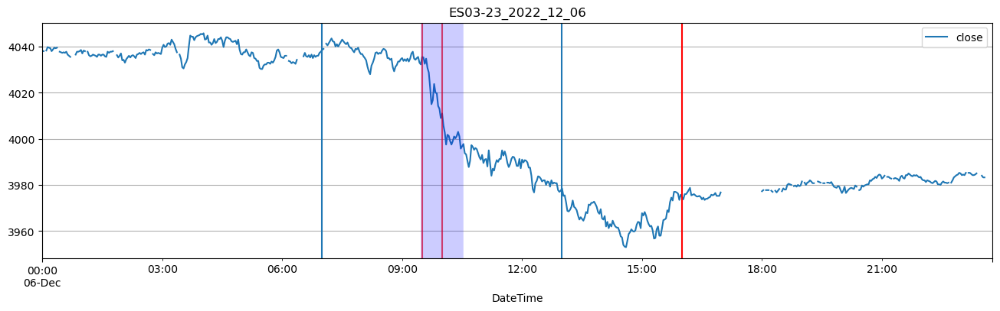

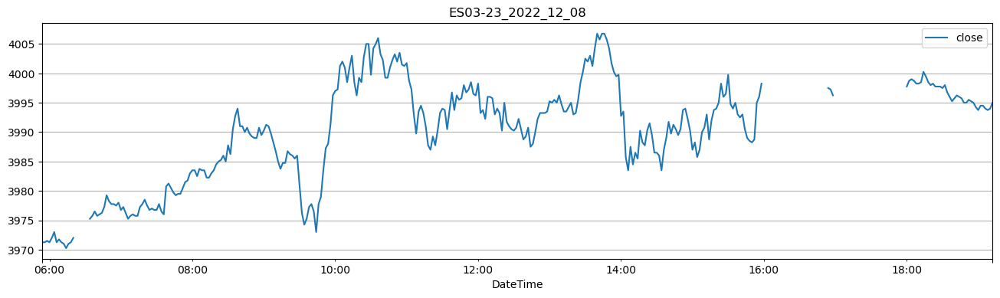

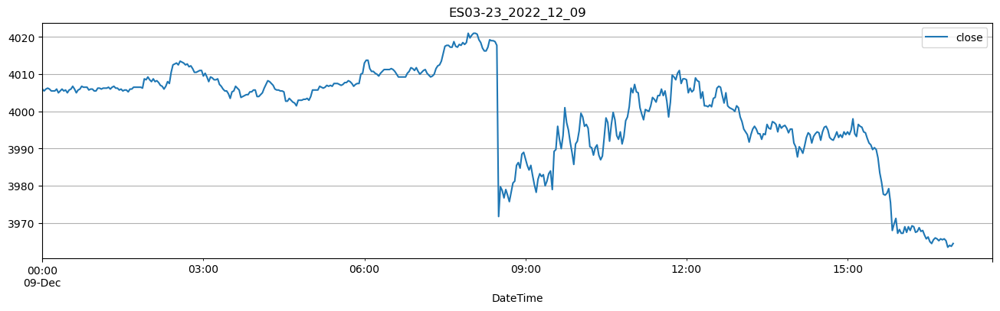

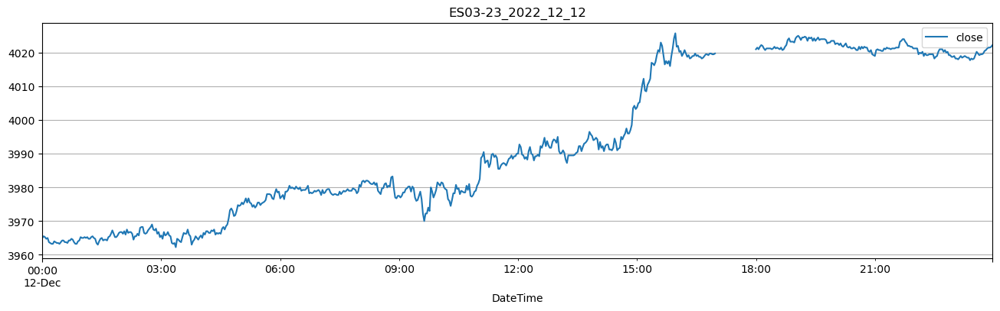

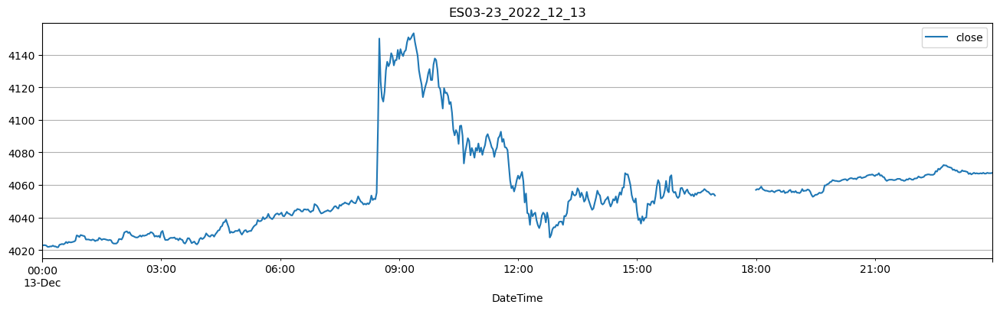

...

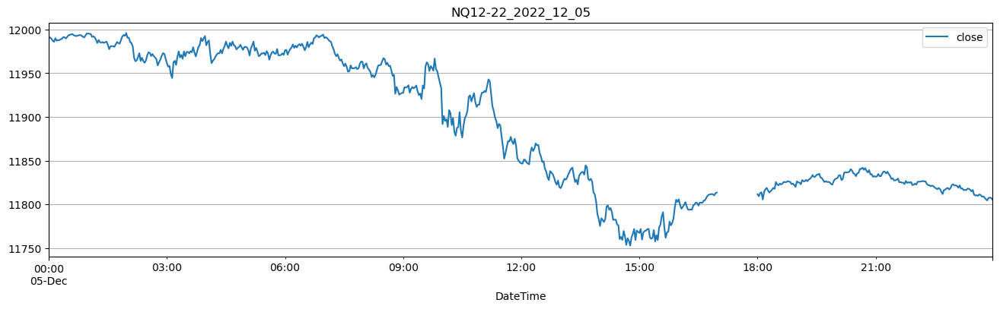

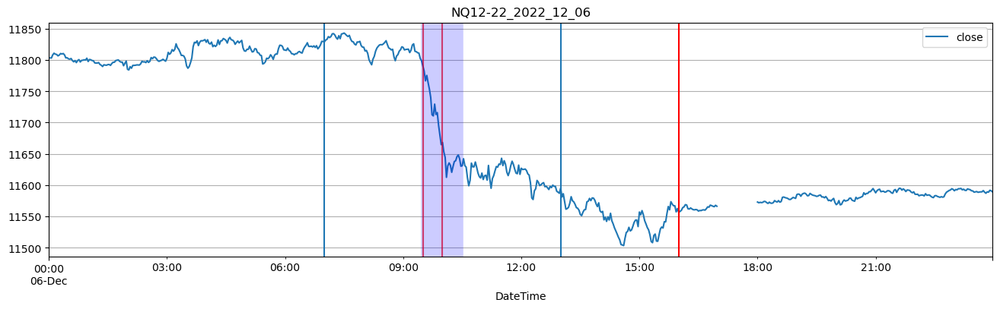

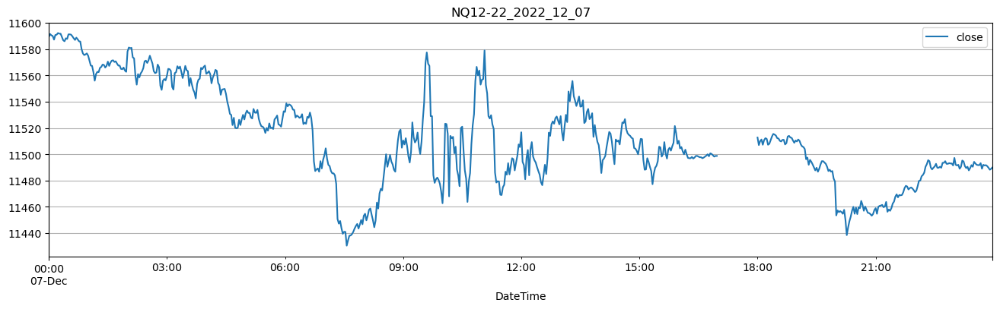

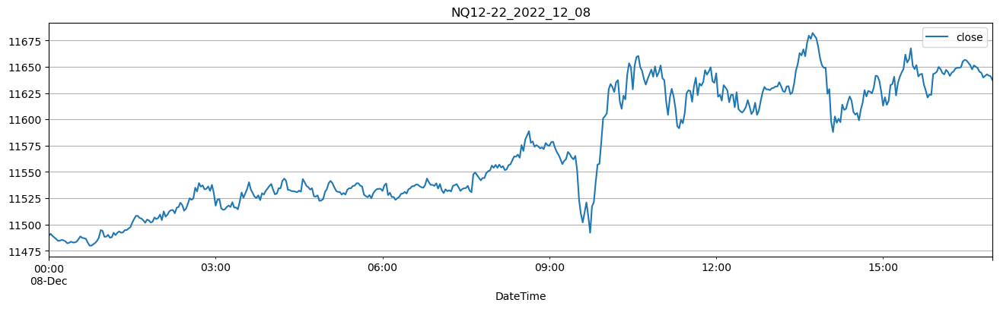

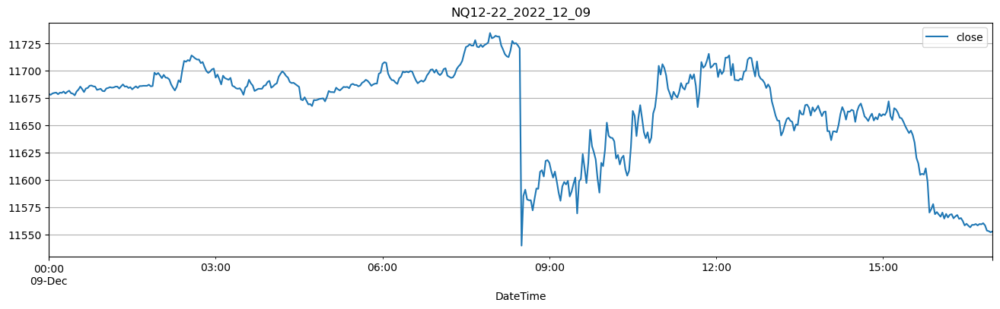

In [135]:
var_holder = {}               
for i in range(1, len(repo)):
    x = repo[i].replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','_').replace('.csv', '').strip() 
    var_holder[x] = x
    var_holder[x] = to_df_OHLC(repo[i], '2Min', True, True)
    var_holder[x].to_csv('C:\\2Min\\'+ x + '.csv')

### Procedure for recreating df from resampled bar df .csv
- pd.read_csv(r"C:\BidAskRepo\30S\ES_2022_12_06.csv", header = 0,
  names=['DateTime', 'Vol','BidAsk','open','high','low','close'], parse_dates=True, index_col=[0])
- min1 = sec30['close'].resample('1Min').ohlc(_method='ohlc') 

In [ ]:
# sec30 = pd.read_csv(r"C:\BidAskRepo\30S\ES_2022_12_06.csv", header = 0,
                    # names=['DateTime', 'Vol','BidAsk','open','high','low','close'], parse_dates=True, index_col=[0])
# sec30.shape  #(2851, 6) 
# sec30 = sec30.dropna()    # (1881, 6)    df.dropna(subset = ['EPS'])
# sec30.shape 
sec30.head()


In [ ]:
# min1 = sec30['close'].resample('1Min').ohlc(_method='ohlc')
min1.shape   #(1426, 4)
# min1 = min5.dropna()
min1.shape   # (1145, 4)
min1.head()

In [ ]:
df.to_csv('C:\\BidAskRepo\\30S\\ES_2022_12_06.csv')  #'C:\\BidAskRepo\\ES 03-23 Globex_2023_01_25.csv

In [ ]:
#----------get directory of csv and make list   we need:  # to_df_OHLC('C:\\BidAskRepo\\ES 03-23 Globex_2022_12_06.csv' , '1Min', True)  
import os
path = "C:\BidAskRepo"
dd = os.listdir(path)
dd.sort()
#----------deal with string of file ------------

repo = []
for i in range(len(dd)):    
    from pathlib import Path
    data_folder = Path("C:/BidAskRepo/")
    file_to_open = data_folder/str(dd[i])
    repo.append(file_to_open.__str__())


In [132]:
#  to_df_OHLC( 'C:\\BidAskRepo\\ES 03-23 Globex_2023_01_25.csv', '15Min', True)      'C:\\BidAskRepo\\ES 03-23 Globex_2023_01_25.csv'

def from_Tick(csvFile, interval, chart):
    tit = str(csvFile).replace('C:\\BidAskRepo\\', '').replace(' Globex_', '').replace('.csv','')
    periodGlobal = interval
    columns = ['DateTime', 'Vol', 'BidAsk', 'Bid', 'Ask', 'Price']
    mapping = {'AtBid': -1, 'AtAsk': 1, 'BelowBid': -2, 'AboveAsk': 2, 'BetweenBidAsk':0 }  
    l = pd.read_csv(csvFile, names = columns, index_col='DateTime', parse_dates= True)  
    l = l.replace({'BidAsk': mapping})
    del l['Ask']
    del l['Bid']
    # l['Date'] = pd.to_datetime(l.index)
    # print(f'Tick shape is: {l.shape}')
    # if chart:
    #     l.plot(y = 'Price', figsize=(16,5))  
    #     plt.title(tit)
    #     plt.grid()
    # l.head()
    return l

def resample_Price(frame, interval):
    # use L for millisec, U for microsec, and S for seconds, Min for minutes
     df = frame['Price'].resample(interval).ohlc(_method='ohlc')
    #  print(df.shape)
     return df
 
def resample_Sum(col, interval):
    #  use L for millisec, U for microsec, S for seconds, Min for minutes 
    c = col.resample(interval).sum()
    # print(c.shape)
    return c

def combine_V_BA(v, ba, interval):
    fr = pd.concat([resample_Sum(v, interval), resample_Sum(ba, interval)], axis=1)
    return fr

def allFrame(a, b):
    fr = pd.concat([a,b], axis= 1)
    return fr
#---------------combined functions into one
def partial_chart(frame, per1, per2):  # function to limit the range of chart display
    t = frame.index.astype(str)
    s1 = t[0][:11]
    s2 = s1 + per1    # '2022-12-05 03:00:00'
    s3 = s1 + per2    # '2022-12-05 16:30:00'
    return frame[s2:s3].plot(y = 'close', figsize=(16,4)) 

# def partial_chart(frame):
#     t = frame.index.astype(str)
#     s1 = t[0][:11]
#     s2 = s1 + '03:00:00'    # '2022-12-05 03:00:00'
#     s3 = s1 + '16:30:00'    # '2022-12-05 16:30:00'
#     return frame[s2:s3].plot(y = 'close', figsize=(16,4)) 
   
def to_df_OHLC(file,  interval, chart, table):
    # tit = repo[i].replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','').replace('.csv', '')
    tit = file.replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','_').replace('.csv', '')
    periodGlobal = interval
    print(f'Interval is {periodGlobal}')
    
    res = from_Tick(file, periodGlobal, chart)    # makes Tick frame  
    qq = resample_Price(res, periodGlobal)   # makes Price bars OHLC
    vol = resample_Sum(res.Vol, periodGlobal) # sums Volume
    bidask = resample_Sum(res.BidAsk, periodGlobal)  # sums standardized BidAsk
    comb = combine_V_BA(vol, bidask, periodGlobal)  # concats Vol and BidAsk columns
    all_comb = allFrame(comb, qq)  # concats all columns into df
    
    print(f"DF shape is: {all_comb.shape}")
    if table:
        print(all_comb.head())
    if chart:
    #     partial_chart(all_comb, '03:00:00', '16:30:00')  # function to limit the range of chart display
        all_comb.plot(y = 'close', figsize=(16,4))    
        plt.title(tit)
        plt.axvline(x= '2022-12-06 07:00:00')
        plt.axvline(x= '2022-12-06 09:30:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
        plt.axvline(x= '2022-12-06 10:00:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
        plt.axvline(x= '2022-12-06 10:00:00', ymax = 1, linewidth= 40, color='blue', alpha=0.2)
        plt.axvline(x= '2022-12-06 13:00:00')
        plt.axvline(x= '2022-12-06 16:00:00', color= 'red')
        plt.grid()
    return all_comb

Interval is 1Min
DF shape is: (1426, 6)


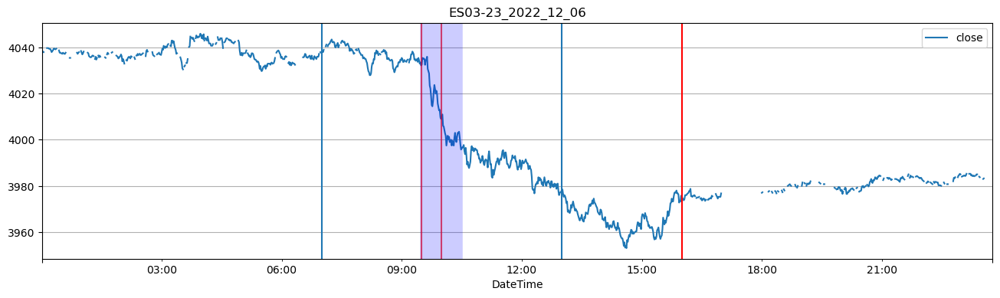

In [130]:
df = to_df_OHLC('C:\\BidAskRepo\\ES 03-23 Globex_2022_12_06.csv' , '1Min', True, False)  

### Zoomed into effective and active M hours, with markers

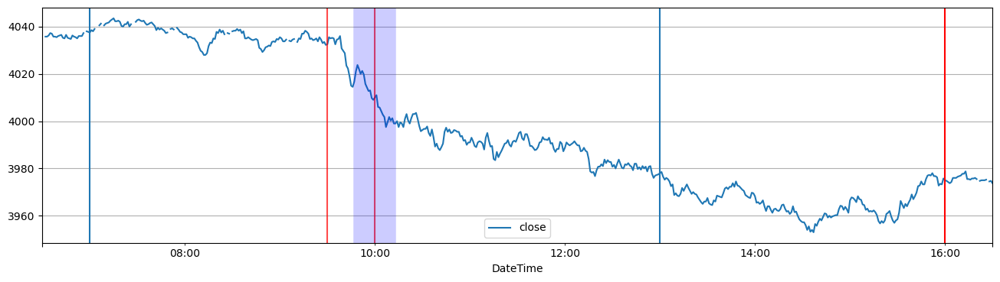

In [131]:
df['2022-12-06 06:30:00':'2022-12-06 16:30:00'].plot(y='close', figsize=(16,4))  
# plt.title(tit)
plt.axvline(x= '2022-12-06 07:00:00')
plt.axvline(x= '2022-12-06 09:30:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
plt.axvline(x= '2022-12-06 10:00:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
plt.axvline(x= '2022-12-06 10:00:00', ymax = 1, linewidth= 40, color='blue', alpha=0.2)
plt.axvline(x= '2022-12-06 13:00:00')
plt.axvline(x= '2022-12-06 16:00:00', color= 'red')
plt.grid()

In [ ]:
# C:\BidAskRepo\ES 03-23 Globex_2022_12_05.csv
# fig, ax = plt.subplots()
# ax.plot(range(20))
# ax.axvspan(8, 14, alpha=0.5, color='red')


aa = to_df_OHLC('C:\BidAskRepo\ES 03-23 Globex_2022_12_05.csv', '1Min', True, True)

In [ ]:

for i in range(1, len(repo)):
    x = repo[i].replace('C:\BidAskRepo\\', '').replace(' ', '').replace('Globex_','').replace('.csv', '')
    var_holder[x] = x
    df[i] = to_df_OHLC(repo[i] , '1Min', True, False)
    # var_holder[x].plot(y = 'close', figsize=(16,5)) 
    # plt.title( repo[i]) 
    # plt.grid()
    
# repo1 = []
# for i in range(len(repo)):
#     newXX = repo[i].replace('C:\BidAskRepo\\', '').replace(' Globex_', ' ').replace(' ', '_')
#     repo1.append(newXX)
  

    
# len(repo1)
# for i in range(len(repo)):
#     print(repo[i])
